# **Vision Eagle Attention - Pytorch**

[![Vision-Eagle.png](https://i.postimg.cc/nzbt9g1v/Vision-Eagle.png)](https://postimg.cc/t15cLrwT)

## Overview

In this notebook, we will develop **Vision Eagle Attention** for image classification using **Convolutional Neural Networks (CNNs)** within the **PyTorch** framework. We will utilize the **Intel Image Classification** dataset, which contains images distributed across six classes: **Buildings, Sea, Mountain, Glacier, Forest, and Street**.


 1. **Key works in this notebook**:
    First, we’ll download the dataset from Kaggle.
    Next, we’ll inspect the data structure to confirm that all necessary images for training and testing are available.
    All images will then be resized to a consistent 100x100-pixel dimension.
    To improve data quality, we’ll apply various transformations, including resizing and converting images to Tensor format.
    We’ll train the model using the training dataset and integrate Vision Eagle Attention to focus on key image features, enhancing the model's capacity to learn important details.
    An optimization algorithm, such as SGD (Stochastic Gradient Descent), will be used to update model weights and minimize loss.
    Once training is complete, we’ll assess the model’s performance on the test dataset.
    We’ll calculate the model’s accuracy and run tests to validate its effectiveness in image classification.
    The model will then generate predictions on a new set of images.
    Finally, we’ll display the results, comparing predictions with actual labels to evaluate the model's performance. For notebook preparation, we will like to thank this notebook creator: https://www.kaggle.com/code/raafatnagy/intel-image-classification-using-cnn-pytorch


---

## Import Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob as gb
from tqdm.auto import tqdm

import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, RandomSampler
from torchvision import datasets, transforms
from PIL import Image

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## Load Data

In [3]:
def download_kaggle_dataset(kaggle_data_path, is_competition=False):
  dataset_name = kaggle_data_path.split("/")[-1]

  # Install Kaggle API
  !pip install -q kaggle

  # Upload the Kaggle API key (kaggle.json)
  from google.colab import files
  files.upload()

  # Move kaggle.json to the .kaggle directory and set proper permissions
  !mkdir -p ~/.kaggle
  !mv kaggle.json ~/.kaggle/
  !chmod 600 ~/.kaggle/kaggle.json

  # Download the dataset or competition data
  if is_competition:
    !kaggle competitions download -c {kaggle_data_path}
  else:
    !kaggle datasets download -d {kaggle_data_path}

  # Unzip the downloaded dataset into the created folder
  !unzip -q {dataset_name}.zip -d {dataset_name}

  # Delete the zip file after unzipping
  !rm {dataset_name}.zip

In [4]:
def check_and_download_dataset(kaggle_path, colab_path):
  try:
    # Check if dataset is already available in Kaggle
    if gb.glob(pathname=kaggle_path+"*"):
      print("Dataset already available in Kaggle")
      return kaggle_path

    # Check if dataset is already downloaded in Colab
    elif gb.glob(pathname=colab_path+"*"):
      print("Dataset already downloaded in Colab")
      return colab_path

    # Raise an error if the dataset is not found
    raise FileNotFoundError

  except FileNotFoundError:
    # If running in Colab, download the dataset
    import google.colab
    print("Running in Google Colab")
    print("Downloading Kaggle dataset...")
    download_kaggle_dataset("puneet6060/intel-image-classification")
    return colab_path

In [5]:
kaggle_path = "/kaggle/input/intel-image-classification/"
colab_path = "/content/intel-image-classification/"
MAIN_PATH = check_and_download_dataset(kaggle_path, colab_path)

Dataset already available in Kaggle


## Data Preprocessing

In [6]:
train_path = MAIN_PATH + "seg_train/seg_train/"
test_path = MAIN_PATH + "seg_test/seg_test/"
pred_path = MAIN_PATH + "seg_pred/seg_pred/"

In [7]:
print("Classes:", os.listdir(train_path))

Classes: ['mountain', 'street', 'buildings', 'sea', 'forest', 'glacier']


In [8]:
def count_image_df(path, title):
  df = pd.DataFrame(columns=[f"{title}_Class", "Count"])
  for folder in os.listdir(path):
    files = gb.glob(pathname= path + folder + "/*.jpg")
    df.loc[len(df.index)] = [folder, len(files)]
  return df

In [9]:
train_count_image = count_image_df(train_path, "Train")
train_count_image

,Train_Class,Count
0,mountain,2512
1,street,2382
2,buildings,2191
3,sea,2274
4,forest,2271
5,glacier,2404


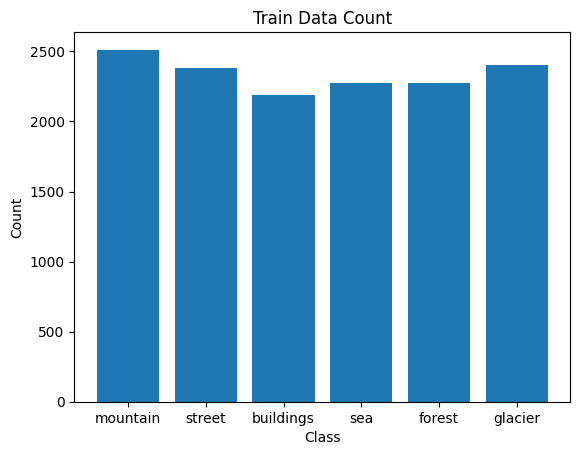

In [10]:
plt.bar(train_count_image["Train_Class"], train_count_image["Count"])
plt.title("Train Data Count")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

In [11]:
test_count_image = count_image_df(test_path, "Test")
test_count_image

,Test_Class,Count
0,mountain,525
1,street,501
2,buildings,437
3,sea,510
4,forest,474
5,glacier,553


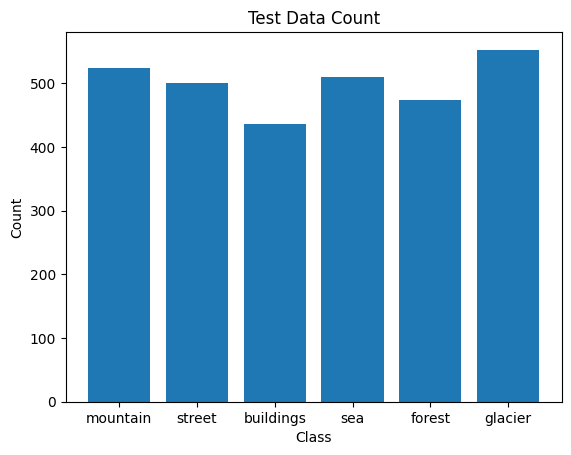

In [12]:
plt.bar(test_count_image["Test_Class"], test_count_image["Count"])
plt.title("Test Data Count")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

In [13]:
files = gb.glob(pathname= pred_path + "*.jpg")
print("Prediction Data Count:", len(files))

Prediction Data Count: 7301


### Get Image Size

In [14]:
def get_image_size(path, is_pred=False):
  size = []

  if is_pred:
    folders = [""]
  else:
    folders = os.listdir(path)

  for folder in tqdm(folders):
    for img in gb.glob(pathname= path + folder + "/*.jpg"):
      image = plt.imread(img)
      size.append(image.shape)
  return pd.Series(size).value_counts()

In [15]:
get_image_size(train_path)

  0%|          | 0/6 [00:00<?, ?it/s]

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(144, 150, 3)        2
(143, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(108, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(100, 150, 3)        1
(141, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(147, 150, 3)        1
(131, 150, 3)        1
(81, 150, 3)         1
(140, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(149, 150, 3)        1
(110, 150, 3)        1
(105, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(76, 150, 3)         1
(119, 150, 3)        1
(102, 150, 3)        1
Name: count, dtype: int64

In [16]:
get_image_size(test_path)

  0%|          | 0/6 [00:00<?, ?it/s]

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
Name: count, dtype: int64

In [17]:
get_image_size(pred_path, is_pred=False)

  0%|          | 0/7301 [00:00<?, ?it/s]

Series([], Name: count, dtype: int64)

Most images size `(150x150x3)`

In [18]:
w, h = 100, 100

## Load Images

In [19]:
global_transforms = transforms.Compose([
  transforms.Resize((w, h)),
  # transforms.Grayscale(),
  transforms.ToTensor()
])

In [20]:
train_data = datasets.ImageFolder(root=train_path, transform=global_transforms)
test_data = datasets.ImageFolder(root=test_path, transform=global_transforms)

In [21]:
for i in range(20):
  print(test_data[i][1],end=", ")

0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [22]:
train_data[0][0].shape , test_data[0][0].shape

(torch.Size([3, 100, 100]), torch.Size([3, 100, 100]))

In [23]:
train_data.class_to_idx

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

In [24]:
class_names = train_data.classes
class_num = len(class_names)
class_names, class_num

(['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'], 6)

In [25]:
class PredictionDataset(Dataset):
  def __init__(self, root, transform=None):
    self.root = root
    self.image_names = os.listdir(root)
    self.transform = transform

  def __len__(self):
    return len(self.image_names)

  def __getitem__(self, idx):
    image = Image.open(self.root + self.image_names[idx]).convert("RGB")
    if self.transform:
      image = self.transform(image)
    return image

In [26]:
pred_data = PredictionDataset(root=pred_path, transform=global_transforms)

In [27]:
pred_data[0].shape

torch.Size([3, 100, 100])

## Visualize Samples of Images

In [28]:
def visualize_Images_samples(data, title, figsize=(16, 6), rows_cols=(3, 10), is_pred=False):
  plt.figure(figsize=(figsize))
  rows, cols = rows_cols
  plt.suptitle(title, fontsize=16, fontweight='bold')

  for i in range(1, rows * cols + 1):
    plt.subplot(rows, cols, i)
    random_idx = int(torch.randint(0, len(data), size=[1]).item())

    if is_pred:
      image = data[random_idx]
    else:
      image, label = data[random_idx]
      plt.title(class_names[label].title(),fontdict={"color":"blue", "fontsize":12})

    plt.imshow(image.permute(1, 2, 0))
    plt.axis('off')

  plt.tight_layout()
  plt.show()

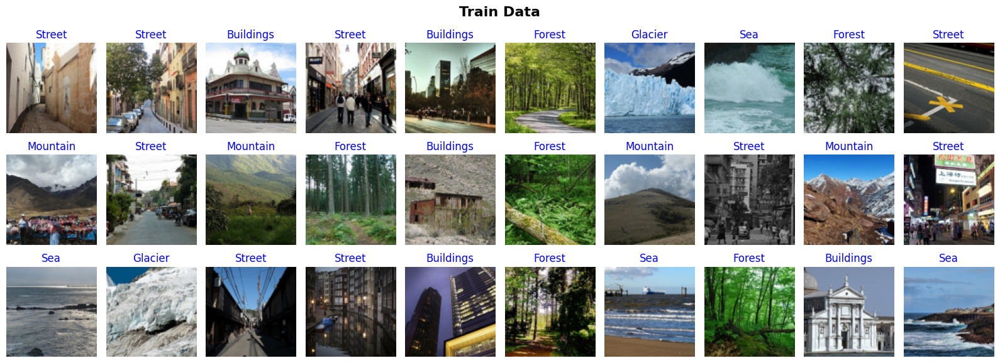

In [29]:
visualize_Images_samples(data=train_data, title="Train Data")

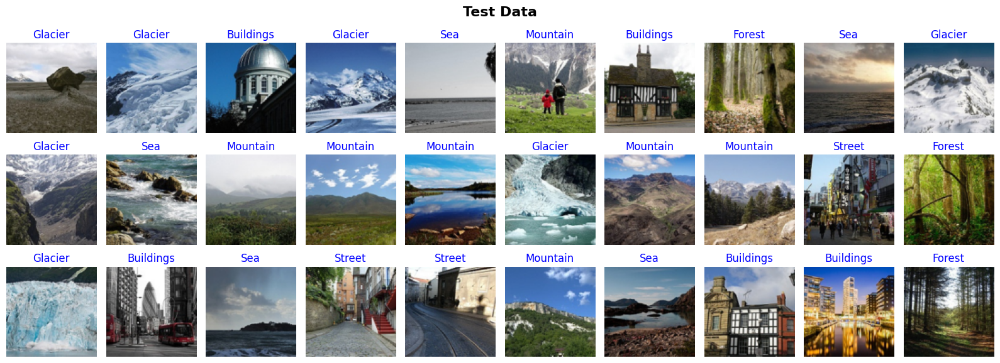

In [30]:
visualize_Images_samples(data=test_data, title="Test Data")

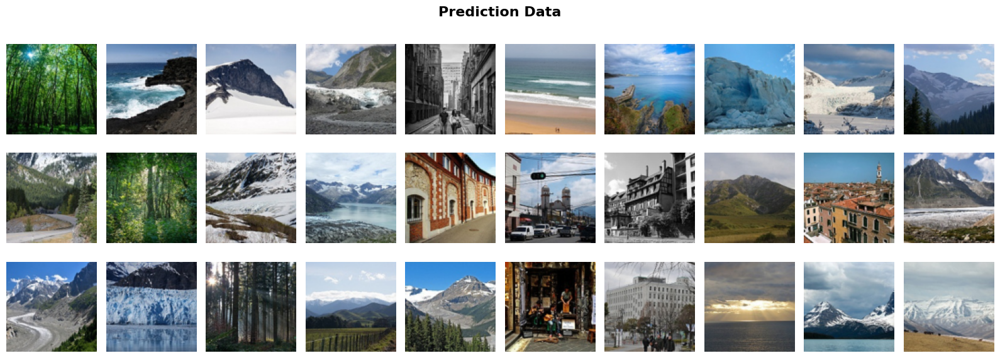

In [31]:
visualize_Images_samples(data=pred_data, title="Prediction Data", is_pred=True)

### Check Shapes

In [32]:
print("train_image shape :", train_data[0][0].shape)
print("test_image shape  :", test_data[0][0].shape)
print("pred_image shape  :", pred_data[0].shape)

train_image shape : torch.Size([3, 100, 100])
test_image shape  : torch.Size([3, 100, 100])
pred_image shape  : torch.Size([3, 100, 100])


## Build Model

In [33]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torchinfo import summary
import torchvision.models as models
class WithoutVisionEagle(nn.Module):
    def __init__(self, num_classes=6):
        super(WithoutVisionEagle, self).__init__()
        self.resnet18 = models.resnet18(pretrained=True)
        self.conv1 = self.resnet18.conv1
        self.bn1 = self.resnet18.bn1  
        self.relu = self.resnet18.relu  
        self.maxpool = self.resnet18.maxpool  
        self.layer1 = self.resnet18.layer1
        self.layer2 = self.resnet18.layer2
        self.layer3 = self.resnet18.layer3
        self.layer4 = self.resnet18.layer4
        self.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        self.fc = nn.Linear(512, 6)

    def forward(self, x):
        x = self.conv1(x) 
        x = self.bn1(x)  
        x = self.relu(x) 
        x = self.maxpool(x)  
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)  
        x = self.fc(x)  
        
        return x

In [34]:
model = WithoutVisionEagle().to(device)
from torchinfo import summary
summary(model,(1,3,64,64))

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 198MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
WithoutVisionEagle                       [1, 6]                    513,000
├─Conv2d: 1-1                            [1, 64, 32, 32]           9,408
├─BatchNorm2d: 1-2                       [1, 64, 32, 32]           128
├─ReLU: 1-3                              [1, 64, 32, 32]           --
├─MaxPool2d: 1-4                         [1, 64, 16, 16]           --
├─Sequential: 1-5                        [1, 64, 16, 16]           --
│    └─BasicBlock: 2-1                   [1, 64, 16, 16]           --
│    │    └─Conv2d: 3-1                  [1, 64, 16, 16]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 16, 16]           128
│    │    └─ReLU: 3-3                    [1, 64, 16, 16]           --
│    │    └─Conv2d: 3-4                  [1, 64, 16, 16]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 16, 16]           128
│    │    └─ReLU: 3-6                    [1, 64, 16, 16]          

## Show Model Summary

In [35]:
try:
  from torchsummary import summary
  print("torchsummary is already installed")
except:
  print("Installing torchsummary...")
  !pip install -q torchsummary
  from torchsummary import summary

Installing torchsummary...


In [36]:
summary(model=model, input_size=train_data[0][0].shape, device=device)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 50, 50]           9,408
            Conv2d-2           [-1, 64, 50, 50]           9,408
       BatchNorm2d-3           [-1, 64, 50, 50]             128
       BatchNorm2d-4           [-1, 64, 50, 50]             128
              ReLU-5           [-1, 64, 50, 50]               0
              ReLU-6           [-1, 64, 50, 50]               0
         MaxPool2d-7           [-1, 64, 25, 25]               0
         MaxPool2d-8           [-1, 64, 25, 25]               0
            Conv2d-9           [-1, 64, 25, 25]          36,864
           Conv2d-10           [-1, 64, 25, 25]          36,864
      BatchNorm2d-11           [-1, 64, 25, 25]             128
      BatchNorm2d-12           [-1, 64, 25, 25]             128
             ReLU-13           [-1, 64, 25, 25]               0
             ReLU-14           [-1, 64,

## Setup DataLoader, Loss, Optimizer, and Evaluation Metrics


In [37]:
test_data_sampler = RandomSampler(test_data)

In [38]:
BATCH_SIZE = 64

train_dataloader = DataLoader(
    dataset=train_data,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

test_dataloader = DataLoader(
    dataset=test_data,
    batch_size=BATCH_SIZE,
    shuffle=False,
    sampler=test_data_sampler,
)

In [39]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=model.parameters(), lr=0.1)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=4, gamma=0.5)

In [40]:
try:
  from torchmetrics.classification import MulticlassAccuracy
  print("torchmetrics is already installed")
except:
  print("Installing torchmetrics...")
  !pip install -q torchmetrics
  from torchmetrics.classification import MulticlassAccuracy

torchmetrics is already installed


In [41]:
accuracy_fn = MulticlassAccuracy(num_classes=class_num).to(device)

## Save Model

In [42]:
def save_model(model, model_path, model_name="model.pth"):
  os.makedirs(model_path, exist_ok=True)
  model_save_path = os.path.join(model_path, model_name)

  torch.save(obj=model.state_dict(), f=model_save_path)
  print(f"Model_Saved_Path: '{model_save_path}'")

## Train Image Classification Model


In [43]:
import torch
from tqdm.auto import tqdm
from torch.utils.data import DataLoader

def train_model(model: torch.nn.Module,
                train_dataloader: DataLoader,
                val_dataloader: DataLoader,
                optimizer: torch.optim.Optimizer,
                loss_fn: torch.nn.Module,
                accuracy_fn,
                epochs: int,
                device: torch.device,
                scheduler=None):
    

  # Set random seeds for reproducibility
  torch.manual_seed(42)
  torch.cuda.manual_seed(42)

  # Lists to store losses and accuracies for training and validation
  train_losses, train_accuracies = [], []
  val_losses, val_accuracies = [], []
  best_val_epoch = 0


  for epoch in range(epochs):
    ### Training Phase ###
    train_loss, train_acc = 0, 0
    model.train()

    for images, labels in tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{epochs}\t"):
      images, labels = images.to(device), labels.to(device)

      # Forward pass
      labels_preds = model(images)

      # Calculate loss
      loss = loss_fn(labels_preds, labels)
      train_loss += loss.item()

      # Calculate accuracy
      train_acc += accuracy_fn(labels_preds.argmax(dim=1), labels).item()

      # Backward pass and optimization
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

    # Average loss and accuracy over the entire training set
    train_loss /= len(train_dataloader)
    train_acc /= len(train_dataloader)
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    ### Validation Phase ###
    val_loss, val_acc = 0, 0
    model.eval()

    with torch.inference_mode():
      for images, labels in tqdm(val_dataloader, desc="Validation", leave=False):
        images, labels = images.to(device), labels.to(device)

        # Forward pass for validation
        labels_preds = model(images)

        # Calculate loss
        val_loss += loss_fn(labels_preds, labels).item()

        # Calculate validation accuracy
        val_acc += accuracy_fn(labels_preds.argmax(dim=1), labels).item()

    # Average loss and accuracy over the entire validation set
    val_loss /= len(val_dataloader)
    val_acc /= len(val_dataloader)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)
    if(val_acc>best_val_epoch):
        best_val_epoch = val_acc
        print("saving")
        MODEL_PATH = "/kaggle/working/models"
        MODEL_NAME = "Image_Classification_Model.pth"
        save_model(model=model, model_path=MODEL_PATH, model_name=MODEL_NAME)
        
    # Print epoch results
    print(f"[Loss: {train_loss:.4f}, Accuracy: {train_acc*100:.2f}% | "
          f"Val_Loss: {val_loss:.4f}, Val_Accuracy: {val_acc*100:.2f}%]")
    print("—" * 73)

    # Step the learning rate scheduler if it is provided
    if scheduler is not None:
      scheduler.step()
    
  # Store the history of losses and accuracies for plotting or analysis later
  history = {
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies
  }

  return history

In [44]:
%%time
epochs = 100

history = train_model(
    model=model,
    train_dataloader=train_dataloader,
    val_dataloader=test_dataloader,
    optimizer=optimizer,
    loss_fn=loss_fn,
    accuracy_fn=accuracy_fn,
    epochs=epochs,
    scheduler=scheduler,
    device=device,
)

Epoch 1/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 1.4553, Accuracy: 58.36% | Val_Loss: 1.5467, Val_Accuracy: 54.88%]
—————————————————————————————————————————————————————————————————————————


Epoch 2/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.5132, Accuracy: 82.98% | Val_Loss: 2.8136, Val_Accuracy: 39.25%]
—————————————————————————————————————————————————————————————————————————


Epoch 3/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.3721, Accuracy: 88.12% | Val_Loss: 4.1261, Val_Accuracy: 68.71%]
—————————————————————————————————————————————————————————————————————————


Epoch 4/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.3057, Accuracy: 91.02% | Val_Loss: 0.7952, Val_Accuracy: 79.04%]
—————————————————————————————————————————————————————————————————————————


Epoch 5/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.1645, Accuracy: 95.10% | Val_Loss: 0.4647, Val_Accuracy: 86.15%]
—————————————————————————————————————————————————————————————————————————


Epoch 6/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.1258, Accuracy: 95.90% | Val_Loss: 0.4836, Val_Accuracy: 87.75%]
—————————————————————————————————————————————————————————————————————————


Epoch 7/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0958, Accuracy: 97.07% | Val_Loss: 3.4604, Val_Accuracy: 60.83%]
—————————————————————————————————————————————————————————————————————————


Epoch 8/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0838, Accuracy: 97.62% | Val_Loss: 0.5878, Val_Accuracy: 86.11%]
—————————————————————————————————————————————————————————————————————————


Epoch 9/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.0381, Accuracy: 98.98% | Val_Loss: 0.4025, Val_Accuracy: 90.46%]
—————————————————————————————————————————————————————————————————————————


Epoch 10/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.0196, Accuracy: 99.56% | Val_Loss: 0.4455, Val_Accuracy: 90.82%]
—————————————————————————————————————————————————————————————————————————


Epoch 11/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0177, Accuracy: 99.63% | Val_Loss: 1.0653, Val_Accuracy: 82.02%]
—————————————————————————————————————————————————————————————————————————


Epoch 12/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0207, Accuracy: 99.48% | Val_Loss: 0.5095, Val_Accuracy: 90.10%]
—————————————————————————————————————————————————————————————————————————


Epoch 13/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.0118, Accuracy: 99.74% | Val_Loss: 0.4555, Val_Accuracy: 90.88%]
—————————————————————————————————————————————————————————————————————————


Epoch 14/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0059, Accuracy: 99.86% | Val_Loss: 0.4596, Val_Accuracy: 90.67%]
—————————————————————————————————————————————————————————————————————————


Epoch 15/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.0066, Accuracy: 99.88% | Val_Loss: 0.4924, Val_Accuracy: 91.00%]
—————————————————————————————————————————————————————————————————————————


Epoch 16/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0069, Accuracy: 99.78% | Val_Loss: 0.5003, Val_Accuracy: 90.59%]
—————————————————————————————————————————————————————————————————————————


Epoch 17/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.0046, Accuracy: 99.87% | Val_Loss: 0.4750, Val_Accuracy: 91.26%]
—————————————————————————————————————————————————————————————————————————


Epoch 18/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

saving
Model_Saved_Path: '/kaggle/working/models/Image_Classification_Model.pth'
[Loss: 0.0049, Accuracy: 99.86% | Val_Loss: 0.4804, Val_Accuracy: 91.60%]
—————————————————————————————————————————————————————————————————————————


Epoch 19/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0044, Accuracy: 99.88% | Val_Loss: 0.4875, Val_Accuracy: 90.92%]
—————————————————————————————————————————————————————————————————————————


Epoch 20/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0035, Accuracy: 99.91% | Val_Loss: 0.4763, Val_Accuracy: 90.95%]
—————————————————————————————————————————————————————————————————————————


Epoch 21/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0035, Accuracy: 99.88% | Val_Loss: 0.4887, Val_Accuracy: 90.99%]
—————————————————————————————————————————————————————————————————————————


Epoch 22/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0034, Accuracy: 99.90% | Val_Loss: 0.4926, Val_Accuracy: 91.17%]
—————————————————————————————————————————————————————————————————————————


Epoch 23/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0033, Accuracy: 99.91% | Val_Loss: 0.4902, Val_Accuracy: 90.87%]
—————————————————————————————————————————————————————————————————————————


Epoch 24/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0049, Accuracy: 99.81% | Val_Loss: 0.5037, Val_Accuracy: 90.97%]
—————————————————————————————————————————————————————————————————————————


Epoch 25/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0060, Accuracy: 99.90% | Val_Loss: 0.4895, Val_Accuracy: 91.37%]
—————————————————————————————————————————————————————————————————————————


Epoch 26/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0024, Accuracy: 99.93% | Val_Loss: 0.4914, Val_Accuracy: 91.21%]
—————————————————————————————————————————————————————————————————————————


Epoch 27/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0044, Accuracy: 99.91% | Val_Loss: 0.5080, Val_Accuracy: 91.00%]
—————————————————————————————————————————————————————————————————————————


Epoch 28/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0058, Accuracy: 99.83% | Val_Loss: 0.4758, Val_Accuracy: 91.40%]
—————————————————————————————————————————————————————————————————————————


Epoch 29/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.92% | Val_Loss: 0.4913, Val_Accuracy: 91.15%]
—————————————————————————————————————————————————————————————————————————


Epoch 30/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0031, Accuracy: 99.92% | Val_Loss: 0.4964, Val_Accuracy: 90.64%]
—————————————————————————————————————————————————————————————————————————


Epoch 31/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0032, Accuracy: 99.94% | Val_Loss: 0.4850, Val_Accuracy: 90.99%]
—————————————————————————————————————————————————————————————————————————


Epoch 32/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0051, Accuracy: 99.91% | Val_Loss: 0.4946, Val_Accuracy: 90.92%]
—————————————————————————————————————————————————————————————————————————


Epoch 33/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0022, Accuracy: 99.93% | Val_Loss: 0.4864, Val_Accuracy: 90.72%]
—————————————————————————————————————————————————————————————————————————


Epoch 34/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0034, Accuracy: 99.87% | Val_Loss: 0.4969, Val_Accuracy: 91.14%]
—————————————————————————————————————————————————————————————————————————


Epoch 35/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0025, Accuracy: 99.93% | Val_Loss: 0.4910, Val_Accuracy: 91.28%]
—————————————————————————————————————————————————————————————————————————


Epoch 36/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0027, Accuracy: 99.96% | Val_Loss: 0.4918, Val_Accuracy: 91.33%]
—————————————————————————————————————————————————————————————————————————


Epoch 37/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.92% | Val_Loss: 0.5034, Val_Accuracy: 91.18%]
—————————————————————————————————————————————————————————————————————————


Epoch 38/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.93% | Val_Loss: 0.4846, Val_Accuracy: 91.23%]
—————————————————————————————————————————————————————————————————————————


Epoch 39/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0025, Accuracy: 99.92% | Val_Loss: 0.5007, Val_Accuracy: 91.05%]
—————————————————————————————————————————————————————————————————————————


Epoch 40/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0047, Accuracy: 99.90% | Val_Loss: 0.5042, Val_Accuracy: 91.08%]
—————————————————————————————————————————————————————————————————————————


Epoch 41/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.94% | Val_Loss: 0.4961, Val_Accuracy: 91.11%]
—————————————————————————————————————————————————————————————————————————


Epoch 42/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0033, Accuracy: 99.89% | Val_Loss: 0.4869, Val_Accuracy: 90.87%]
—————————————————————————————————————————————————————————————————————————


Epoch 43/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0033, Accuracy: 99.90% | Val_Loss: 0.4722, Val_Accuracy: 90.63%]
—————————————————————————————————————————————————————————————————————————


Epoch 44/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.91% | Val_Loss: 0.4916, Val_Accuracy: 91.06%]
—————————————————————————————————————————————————————————————————————————


Epoch 45/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0025, Accuracy: 99.93% | Val_Loss: 0.4951, Val_Accuracy: 90.89%]
—————————————————————————————————————————————————————————————————————————


Epoch 46/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.93% | Val_Loss: 0.4877, Val_Accuracy: 91.07%]
—————————————————————————————————————————————————————————————————————————


Epoch 47/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0031, Accuracy: 99.92% | Val_Loss: 0.4945, Val_Accuracy: 91.00%]
—————————————————————————————————————————————————————————————————————————


Epoch 48/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.90% | Val_Loss: 0.4974, Val_Accuracy: 91.20%]
—————————————————————————————————————————————————————————————————————————


Epoch 49/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0024, Accuracy: 99.94% | Val_Loss: 0.4933, Val_Accuracy: 90.79%]
—————————————————————————————————————————————————————————————————————————


Epoch 50/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0027, Accuracy: 99.92% | Val_Loss: 0.4905, Val_Accuracy: 91.06%]
—————————————————————————————————————————————————————————————————————————


Epoch 51/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.93% | Val_Loss: 0.4828, Val_Accuracy: 91.00%]
—————————————————————————————————————————————————————————————————————————


Epoch 52/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0023, Accuracy: 99.84% | Val_Loss: 0.4777, Val_Accuracy: 90.99%]
—————————————————————————————————————————————————————————————————————————


Epoch 53/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0044, Accuracy: 99.83% | Val_Loss: 0.4787, Val_Accuracy: 91.17%]
—————————————————————————————————————————————————————————————————————————


Epoch 54/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0024, Accuracy: 99.93% | Val_Loss: 0.4905, Val_Accuracy: 91.02%]
—————————————————————————————————————————————————————————————————————————


Epoch 55/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.92% | Val_Loss: 0.5123, Val_Accuracy: 90.96%]
—————————————————————————————————————————————————————————————————————————


Epoch 56/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.90% | Val_Loss: 0.4935, Val_Accuracy: 90.86%]
—————————————————————————————————————————————————————————————————————————


Epoch 57/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.92% | Val_Loss: 0.4884, Val_Accuracy: 91.39%]
—————————————————————————————————————————————————————————————————————————


Epoch 58/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0039, Accuracy: 99.92% | Val_Loss: 0.4913, Val_Accuracy: 90.94%]
—————————————————————————————————————————————————————————————————————————


Epoch 59/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0040, Accuracy: 99.80% | Val_Loss: 0.4858, Val_Accuracy: 91.25%]
—————————————————————————————————————————————————————————————————————————


Epoch 60/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.92% | Val_Loss: 0.4985, Val_Accuracy: 91.08%]
—————————————————————————————————————————————————————————————————————————


Epoch 61/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0027, Accuracy: 99.92% | Val_Loss: 0.4690, Val_Accuracy: 91.34%]
—————————————————————————————————————————————————————————————————————————


Epoch 62/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.92% | Val_Loss: 0.4849, Val_Accuracy: 91.29%]
—————————————————————————————————————————————————————————————————————————


Epoch 63/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0033, Accuracy: 99.91% | Val_Loss: 0.4922, Val_Accuracy: 91.15%]
—————————————————————————————————————————————————————————————————————————


Epoch 64/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0021, Accuracy: 99.96% | Val_Loss: 0.4875, Val_Accuracy: 90.87%]
—————————————————————————————————————————————————————————————————————————


Epoch 65/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0025, Accuracy: 99.93% | Val_Loss: 0.4950, Val_Accuracy: 91.18%]
—————————————————————————————————————————————————————————————————————————


Epoch 66/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.84% | Val_Loss: 0.4937, Val_Accuracy: 90.75%]
—————————————————————————————————————————————————————————————————————————


Epoch 67/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.91% | Val_Loss: 0.4902, Val_Accuracy: 91.01%]
—————————————————————————————————————————————————————————————————————————


Epoch 68/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.91% | Val_Loss: 0.4877, Val_Accuracy: 91.31%]
—————————————————————————————————————————————————————————————————————————


Epoch 69/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.93% | Val_Loss: 0.4933, Val_Accuracy: 91.55%]
—————————————————————————————————————————————————————————————————————————


Epoch 70/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.92% | Val_Loss: 0.4887, Val_Accuracy: 91.18%]
—————————————————————————————————————————————————————————————————————————


Epoch 71/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.92% | Val_Loss: 0.4932, Val_Accuracy: 91.29%]
—————————————————————————————————————————————————————————————————————————


Epoch 72/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.94% | Val_Loss: 0.4950, Val_Accuracy: 91.07%]
—————————————————————————————————————————————————————————————————————————


Epoch 73/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.91% | Val_Loss: 0.4908, Val_Accuracy: 91.00%]
—————————————————————————————————————————————————————————————————————————


Epoch 74/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0034, Accuracy: 99.91% | Val_Loss: 0.4896, Val_Accuracy: 91.28%]
—————————————————————————————————————————————————————————————————————————


Epoch 75/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.92% | Val_Loss: 0.4779, Val_Accuracy: 90.98%]
—————————————————————————————————————————————————————————————————————————


Epoch 76/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.85% | Val_Loss: 0.5152, Val_Accuracy: 91.08%]
—————————————————————————————————————————————————————————————————————————


Epoch 77/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.92% | Val_Loss: 0.4832, Val_Accuracy: 91.02%]
—————————————————————————————————————————————————————————————————————————


Epoch 78/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0030, Accuracy: 99.93% | Val_Loss: 0.4845, Val_Accuracy: 91.26%]
—————————————————————————————————————————————————————————————————————————


Epoch 79/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.94% | Val_Loss: 0.4988, Val_Accuracy: 91.30%]
—————————————————————————————————————————————————————————————————————————


Epoch 80/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0025, Accuracy: 99.94% | Val_Loss: 0.4917, Val_Accuracy: 91.04%]
—————————————————————————————————————————————————————————————————————————


Epoch 81/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0040, Accuracy: 99.82% | Val_Loss: 0.5025, Val_Accuracy: 90.83%]
—————————————————————————————————————————————————————————————————————————


Epoch 82/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.83% | Val_Loss: 0.4975, Val_Accuracy: 91.26%]
—————————————————————————————————————————————————————————————————————————


Epoch 83/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.92% | Val_Loss: 0.4970, Val_Accuracy: 90.95%]
—————————————————————————————————————————————————————————————————————————


Epoch 84/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0040, Accuracy: 99.82% | Val_Loss: 0.4943, Val_Accuracy: 91.11%]
—————————————————————————————————————————————————————————————————————————


Epoch 85/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0034, Accuracy: 99.81% | Val_Loss: 0.4961, Val_Accuracy: 91.05%]
—————————————————————————————————————————————————————————————————————————


Epoch 86/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0027, Accuracy: 99.93% | Val_Loss: 0.4964, Val_Accuracy: 90.76%]
—————————————————————————————————————————————————————————————————————————


Epoch 87/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0027, Accuracy: 99.92% | Val_Loss: 0.4911, Val_Accuracy: 91.14%]
—————————————————————————————————————————————————————————————————————————


Epoch 88/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.92% | Val_Loss: 0.4901, Val_Accuracy: 91.31%]
—————————————————————————————————————————————————————————————————————————


Epoch 89/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0034, Accuracy: 99.83% | Val_Loss: 0.4874, Val_Accuracy: 90.76%]
—————————————————————————————————————————————————————————————————————————


Epoch 90/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.92% | Val_Loss: 0.4885, Val_Accuracy: 90.96%]
—————————————————————————————————————————————————————————————————————————


Epoch 91/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0022, Accuracy: 99.94% | Val_Loss: 0.4819, Val_Accuracy: 91.53%]
—————————————————————————————————————————————————————————————————————————


Epoch 92/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.91% | Val_Loss: 0.4969, Val_Accuracy: 90.76%]
—————————————————————————————————————————————————————————————————————————


Epoch 93/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.93% | Val_Loss: 0.4925, Val_Accuracy: 91.18%]
—————————————————————————————————————————————————————————————————————————


Epoch 94/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0026, Accuracy: 99.92% | Val_Loss: 0.4881, Val_Accuracy: 90.63%]
—————————————————————————————————————————————————————————————————————————


Epoch 95/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0029, Accuracy: 99.93% | Val_Loss: 0.4868, Val_Accuracy: 91.01%]
—————————————————————————————————————————————————————————————————————————


Epoch 96/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0033, Accuracy: 99.92% | Val_Loss: 0.4792, Val_Accuracy: 91.14%]
—————————————————————————————————————————————————————————————————————————


Epoch 97/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0028, Accuracy: 99.92% | Val_Loss: 0.4999, Val_Accuracy: 90.90%]
—————————————————————————————————————————————————————————————————————————


Epoch 98/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0024, Accuracy: 99.93% | Val_Loss: 0.4893, Val_Accuracy: 91.33%]
—————————————————————————————————————————————————————————————————————————


Epoch 99/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0025, Accuracy: 99.92% | Val_Loss: 0.4904, Val_Accuracy: 91.12%]
—————————————————————————————————————————————————————————————————————————


Epoch 100/100	:   0%|          | 0/220 [00:00<?, ?it/s]

Validation:   0%|          | 0/47 [00:00<?, ?it/s]

[Loss: 0.0039, Accuracy: 99.90% | Val_Loss: 0.4908, Val_Accuracy: 91.18%]
—————————————————————————————————————————————————————————————————————————
CPU times: user 35min 29s, sys: 1min 53s, total: 37min 22s
Wall time: 51min 33s


In [45]:
def plot_losses(train_losses, val_losses):
  plt.plot(train_losses, label='Train Loss', color="green")
  plt.plot(val_losses, label='Val Loss', color="red")
  plt.title("Training and Validation Losses")
  # plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.legend()
  plt.grid()

def plot_accuracies(train_accuracies, val_accuracies):
  plt.plot(train_accuracies, label='Train Accuracy', color="green")
  plt.plot(val_accuracies, label='Val Accuracy', color="red")
  plt.title("Training and Validation Accuracies")
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.legend()
  plt.grid()

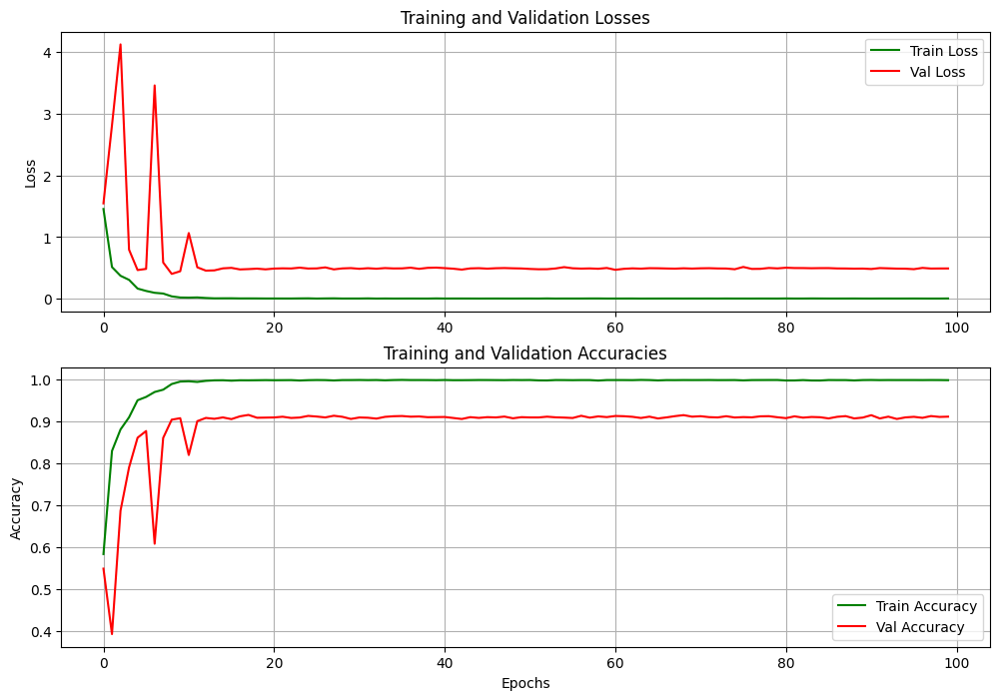

In [46]:
plt.figure(figsize=(12, 8))

plt.subplot(2, 1, 1)
plot_losses(history["train_losses"],history["val_losses"])

plt.subplot(2, 1, 2)
plot_accuracies(history["train_accuracies"], history["val_accuracies"])
plt.show()

## Evaluate Model


In [47]:
import torch
from tqdm import tqdm

def evaluation(model: torch.nn.Module, data: DataLoader, device=device):
    total_loss, correct_predictions, total_samples = 0, 0, 0
    model.eval()

    with torch.inference_mode():
        for images, labels in tqdm(data, desc="Evaluation"):
            images, labels = images.to(device), labels.to(device)
            
            # Forward pass
            labels_preds = model(images)
            
            # Calculate batch loss
            total_loss += loss_fn(labels_preds, labels).item() * images.size(0)  # multiply by batch size to sum

            # Calculate batch accuracy
            if labels.ndim == 2:  # if labels are one-hot encoded
                labels = labels.argmax(dim=1)
            
            correct_predictions += (labels_preds.argmax(dim=1) == labels).sum().item()
            total_samples += labels.size(0)

    # Average loss and accuracy over the entire validation set
    avg_loss = total_loss / total_samples
    avg_accuracy = correct_predictions / total_samples

    return avg_loss, avg_accuracy


In [48]:
model = WithoutVisionEagle()  

MODEL_PATH = "/kaggle/working/models"
MODEL_NAME = "Image_Classification_Model.pth"
model_load_path = os.path.join(MODEL_PATH, MODEL_NAME)

model.load_state_dict(torch.load(model_load_path))
model = model.to(device)
model.eval()  

print(f"Model Loaded from Path: '{model_load_path}'")

Model Loaded from Path: '/kaggle/working/models/Image_Classification_Model.pth'


In [49]:
loss, accuracy = evaluation(model, test_dataloader)

print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

Evaluation: 100%|██████████| 47/47 [00:04<00:00,  9.65it/s]

Test Loss: 0.4795922258694967
Test Accuracy: 0.9093333333333333


## Make Predictions

In [50]:
def predict(model: torch.nn.Module, data_loader: DataLoader, device=device):
  model.eval()
  pred_labels = []
  true_labels = []

  with torch.inference_mode():
    for images, labels in data_loader:
      images = images.to(device)
      y_pred = model(images).argmax(dim=1)

      pred_labels.append(y_pred)
      true_labels.append(labels)

  pred_labels = torch.cat(pred_labels)
  true_labels = torch.cat(true_labels)

  return pred_labels, true_labels

In [51]:
pred_labels, true_labels = predict(model, test_dataloader)

## Visualize Comparing The Prediciton To The Target Label

In [52]:
def plot_predictions(model, data, class_names=class_names, device=device):
  plt.figure(figsize=(16, 9))
  rows, cols = 4, 9

  for i in range(1, rows * cols + 1):
    plt.subplot(rows, cols, i)

    random_idx = int(torch.randint(0, len(data), size=[1]).item())
    image, label = data[random_idx]

    model.eval()
    with torch.inference_mode():
      pred_label = model(image.unsqueeze(0).to(device)).argmax(dim=1)

    plt.imshow(image.permute(1, 2, 0))
    plt.axis('off')


    title_text = f"Pred: {class_names[pred_label]} \nTrue: {class_names[label]}".title()
    if pred_label == label:
      plt.title(title_text, fontsize=10, c="g")
    else:
      plt.title(title_text, fontsize=10, c="r")

  plt.tight_layout()
  plt.show()

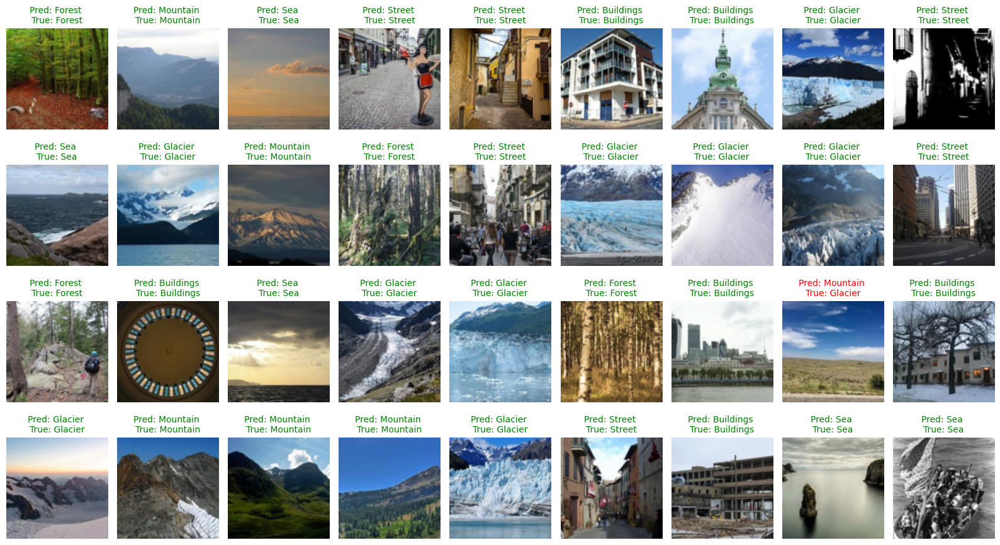

In [53]:
plot_predictions(data=test_data, model=model)

## Plot a Confusion Matrix

In [54]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

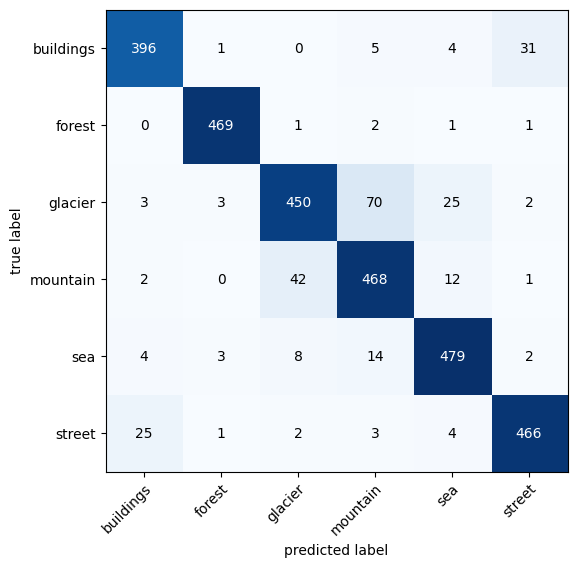

In [55]:
confmat = ConfusionMatrix(task="multiclass",num_classes=class_num).to(device)
confmat_numpy = confmat(pred_labels.to(device), true_labels.to(device)).cpu().numpy()

plot_confusion_matrix(
    conf_mat=confmat_numpy,
    class_names=class_names,
    figsize=(7, 6)
);

## Predict New Data


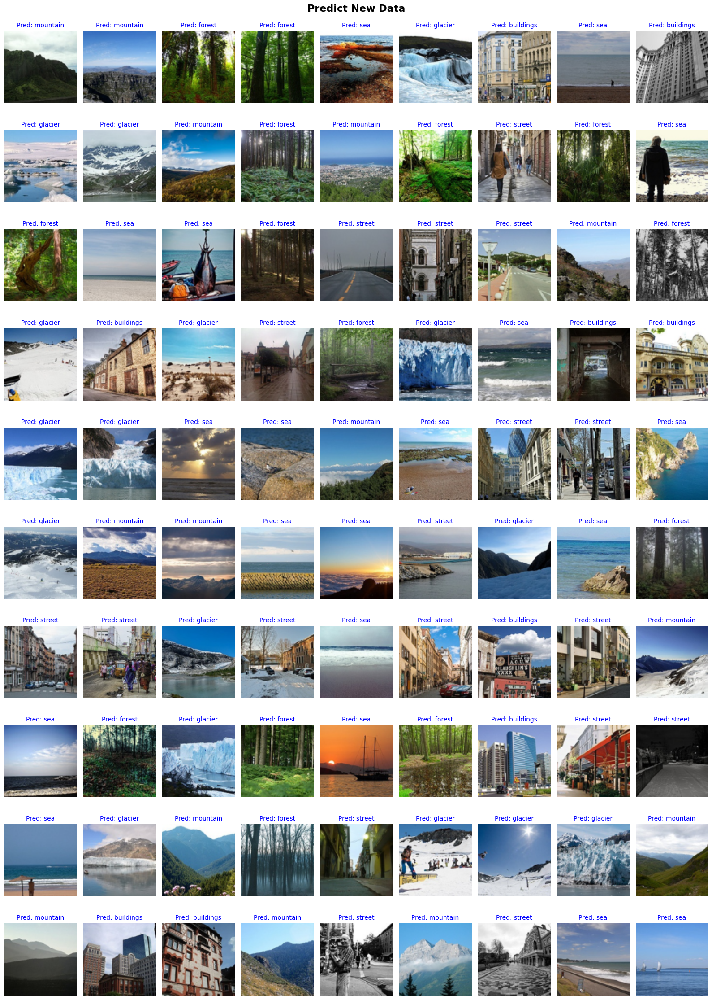

In [56]:
plt.figure(figsize=(16, 23))
rows, cols = 10, 9
plt.suptitle("Predict New Data\n", fontsize=16, fontweight='bold')

for i in range(1, rows * cols + 1):
  plt.subplot(rows, cols, i)

  random_idx = int(torch.randint(0, len(pred_data), size=[1]).item())
  image = pred_data[random_idx]

  model.eval()
  with torch.inference_mode():
    pred_label = model(image.unsqueeze(0).to(device)).argmax(dim=1)

  plt.imshow(image.permute(1, 2, 0))
  plt.axis('off')
  plt.title(f"Pred: {class_names[pred_label]}", fontsize=10, c="blue")

plt.tight_layout()
plt.show()